In [1]:
# Mohammad Hossein Zehtab
# Machine-Learning-Fridays
# Housing_Linear_Regression_Using_Sklearn_Project

# Importing Packages

In [60]:
# Importing necessary packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy import stats
import dtreeviz

# Importing sklearn tools and algorithms
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import export_text
from sklearn import metrics
from sklearn.ensemble import RandomForestRegressor

# Warning handling
import warnings
warnings.filterwarnings("ignore")

# Reading Housing Dataset

In [3]:
housing = pd.read_csv("housing.csv")
housing.shape

(20640, 10)

In [4]:
# Coping 'housing' dataframe into 'df1'
df1 = housing.copy()
df1.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


# Housing Dataset Preprocessing

## Housing Dataframe Information

In [5]:
# Checking 'df1' information
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


**Insight**
- There are 29640 samples in this dataframe.
- There are 7 informative features and one target ('median_house_value') in this dataframe.
- Features 'longitude' and 'latitude' are not informative and will get dropped.
- Among the features, data type of 'ocean_proximity' is string (which needs to get encoded) and the others are numeric.
- Only one feature 'total_bedrooms' has missing values which needs to be handled.
- Because of the variaty of value ranges, the dataframe needs to get scaled.
- For easier data wrangling, the target column will push to the start of the dataframe.

## Dropping Uninformative Columns

In [6]:
df2 = df1.drop(columns=["longitude", "latitude"])
df2.tail()

,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
20635,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND
20639,16.0,2785.0,616.0,1387.0,530.0,2.3886,89400.0,INLAND


## Rearranging columns

In [7]:
df2.columns.tolist()

['housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_income',
 'median_house_value',
 'ocean_proximity']

In [8]:
df3 = df2[["median_house_value", "housing_median_age", "total_rooms", "total_bedrooms",
           "population", "households", "median_income", "ocean_proximity"]]
df3.sample(5)

,median_house_value,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
8073,268400.0,52.0,2569.0,484.0,1030.0,451.0,4.1301,NEAR OCEAN
15046,307100.0,8.0,3600.0,492.0,1421.0,482.0,6.2609,<1H OCEAN
2719,88500.0,21.0,1260.0,246.0,805.0,239.0,2.6172,INLAND
16423,162500.0,31.0,1860.0,394.0,1848.0,293.0,2.2891,INLAND
19217,194300.0,16.0,3452.0,791.0,1567.0,731.0,2.4722,<1H OCEAN


## Handling Missing Values

In [9]:
# Number of missing values
df3.isnull().sum()

median_house_value      0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
ocean_proximity         0
dtype: int64

In [10]:
# Catching rows with missing values
mask = df3.isnull().any(axis=1)
df3.query("@mask == True")

,median_house_value,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
290,161900.0,47.0,1256.0,NaN,570.0,218.0,4.3750,NEAR BAY
341,85100.0,38.0,992.0,NaN,732.0,259.0,1.6196,NEAR BAY
538,173400.0,29.0,5154.0,NaN,3741.0,1273.0,2.5762,NEAR BAY
563,247100.0,45.0,891.0,NaN,384.0,146.0,4.9489,NEAR BAY
696,178400.0,41.0,746.0,NaN,387.0,161.0,3.9063,NEAR BAY
...,...,...,...,...,...,...,...,...
20267,220500.0,18.0,3620.0,NaN,3171.0,779.0,3.3409,NEAR OCEAN
20268,167400.0,19.0,2393.0,NaN,1938.0,762.0,1.6953,NEAR OCEAN
20372,410700.0,15.0,4260.0,NaN,1701.0,669.0,5.1033,<1H OCEAN
20460,258100.0,17.0,5512.0,NaN,2734.0,814.0,6.6073,<1H OCEAN


In [11]:
# Filling the missing values of 'total_bedrooms' using mean strategy
df4 = df3.copy()
df4["total_bedrooms"].fillna(value=df4["total_bedrooms"].mean(), inplace=True)

In [12]:
# Checking if handling the missing values are done correctly
df4.loc[538, :]

median_house_value      173400.0
housing_median_age          29.0
total_rooms               5154.0
total_bedrooms        537.870553
population                3741.0
households                1273.0
median_income             2.5762
ocean_proximity         NEAR BAY
Name: 538, dtype: object

In [13]:
# Checking if there are any missing values left
df4.isnull().sum()

median_house_value    0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
ocean_proximity       0
dtype: int64

## Handling Duplicated Rows

In [14]:
df4.duplicated().sum()

0

**Insight**

There are no duplicated rows

## Encoding Non Numeric Features

In [15]:
df4.sample(5)

,median_house_value,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
19350,266700.0,33.0,1530.0,266.0,728.0,250.0,5.1005,<1H OCEAN
9122,138100.0,7.0,20377.0,4335.0,11973.0,3933.0,3.3086,INLAND
9060,126500.0,25.0,1703.0,342.0,775.0,309.0,4.5455,INLAND
1600,257100.0,30.0,3227.0,733.0,1260.0,684.0,4.1250,NEAR BAY
6809,192500.0,20.0,3090.0,802.0,2109.0,738.0,3.3801,<1H OCEAN


In [16]:
# Getting unique values of 'ocean_proximity' feature
df4["ocean_proximity"].unique()

array(['NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'ISLAND'],
      dtype=object)

In [17]:
# One hot encoding of 'ocean_proximity' feature
df5 = pd.get_dummies(data=df4, columns=["ocean_proximity"], drop_first=True, dtype=int, prefix="op")
df5.sample(10)

,median_house_value,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,op_INLAND,op_ISLAND,op_NEAR BAY,op_NEAR OCEAN
8490,159400.0,27.0,1013.0,394.0,1067.0,400.0,1.7714,0,0,0,0
13587,68200.0,47.0,1648.0,432.0,1308.0,385.0,1.2069,1,0,0,0
8828,200000.0,36.0,1390.0,458.0,874.0,468.0,2.5812,0,0,0,0
11423,252900.0,26.0,2553.0,405.0,1337.0,411.0,5.3737,0,0,0,0
16275,48300.0,31.0,1673.0,382.0,1734.0,400.0,2.0833,1,0,0,0
9288,435900.0,20.0,4536.0,708.0,1812.0,701.0,6.0433,0,0,1,0
9720,253800.0,16.0,1680.0,285.0,1103.0,275.0,4.6125,0,0,0,0
18672,252300.0,29.0,3457.0,699.0,1327.0,563.0,3.6597,0,0,0,1
19198,193200.0,31.0,1808.0,315.0,691.0,280.0,3.8583,0,0,0,0
13227,95600.0,30.0,2598.0,573.0,2170.0,518.0,2.3000,1,0,0,0


## Handling Outliers

**Note**

- Since 'op_INLAND', 'op_ISLAND', 'op_NEAR BAY' and 'op_NEAR OCEAN' features have binary values, outlier handling is not necessary for them.

### Plotting Box Plots

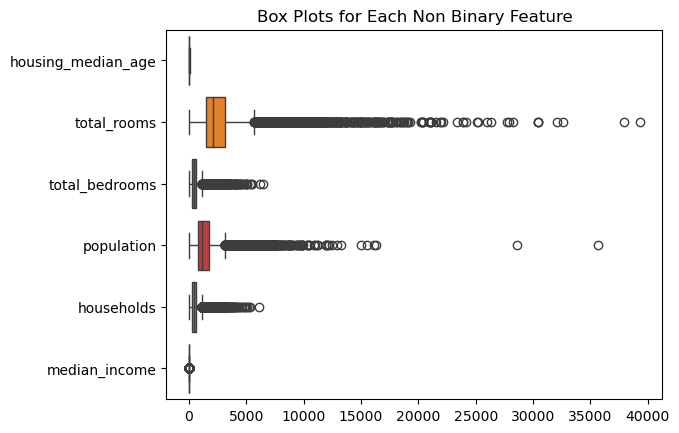

In [18]:
# Plotting box plots for each non binary feature as a general view
plt.title("Box Plots for Each Non Binary Feature")
sns.boxplot(data=df5.iloc[:, 1:7], orient="h")
plt.show()

### Outlier Detection Using Zscore

In [19]:
# Turning feature values into zscore values
zscores = [stats.zscore(df5[feature]) for feature in df5.columns[1:7]]
len(zscores), type(zscores)

(6, list)

In [20]:
df5.columns.tolist()

['median_house_value',
 'housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_income',
 'op_INLAND',
 'op_ISLAND',
 'op_NEAR BAY',
 'op_NEAR OCEAN']

In [21]:
# Outliers for each non binary feature using zscore
zscore_housing_median_age = df5[np.abs(zscores[0]) > 3]
zscore_total_rooms = df5[np.abs(zscores[1]) > 3]
zscore_total_bedrooms = df5[np.abs(zscores[2]) > 3]
zscore_population = df5[np.abs(zscores[3]) > 3]
zscore_households = df5[np.abs(zscores[4]) > 3]
zscore_median_income = df5[np.abs(zscores[5]) > 3]
outliers_using_zscore = pd.concat([zscore_housing_median_age, zscore_total_rooms, zscore_total_bedrooms,
                                   zscore_population, zscore_households, zscore_median_income], axis=0)
outliers_using_zscore.shape

(1798, 11)

### Outlier Detection Using 3*Sigma Based on Normal Distribution

In [22]:
# Outlier indices using 3*sigma based on normal distribution
def find_outlier_index_using_3sigma(dataframe) -> list:
    '''
    Finding outlier indices using 3*sigma based on normal distribution.
    '''
    features = df5.columns[1:7].tolist()
 
    outlier_index_3sigma = list()
    for feature in features:
        selected_column = df5[feature]
            
        mu = selected_column.mean()
        sigma = selected_column.std()
        lower_limit = mu - 3 * sigma
        upper_limit = mu + 3 * sigma
        
        mask = (selected_column < lower_limit)|(selected_column > upper_limit)
        outliers = selected_column[mask]
        outlier_indices = outliers.index
        # print(outlier_indices)    Debugging
        
        if len(outlier_indices) == 0: continue
        # print(f"{feature:15},\t{label:15},\t outlier indices={outlier_indices.values}")    #Debugging
        outlier_index_3sigma.extend(outlier_indices)
            
    return outlier_index_3sigma

### Driver Code ###
outlier_indices_using_3sigma = find_outlier_index_using_3sigma(df5)
print("\nNumber of outlier indices using 3sigma:", len(outlier_indices_using_3sigma))


Number of outlier indices using 3sigma: 1798


**Note**

It is clear that detecting outliers using zscore and using 3*sigma will result the same. So using one of them is good enough.

### Outlier Detection Using IQR

In [23]:
# Outlier indices using iqr
def find_outlier_index_using_iqr(dataframe) -> list:
    '''
    Finding outlier indices using iqr.
    '''
    features = df5.columns[1:7].tolist()

    outlier_index_iqr = list()
    for feature in features:
        selected_column = df5[feature]
        
        q1 = selected_column.quantile(0.25)    # First quartile
        q3 = selected_column.quantile(0.75)    # Third quartile
        iqr = q3 - q1
        lower_limit = q1 - 1.5 * iqr
        upper_limit = q3 + 1.5 * iqr
        
        mask = (selected_column < lower_limit)|(selected_column > upper_limit)
        outliers = selected_column[mask]
        outlier_indices = outliers.index
        
        if len(outlier_indices) == 0: continue
        # print(f"{feature:15},\t{label:15},\t outlier indices={outlier_indices.values}")    #Debugging
        outlier_index_iqr.extend(outlier_indices)
            
    return outlier_index_iqr

### Driver Code ###
outlier_indices_using_iqr = find_outlier_index_using_iqr(df5)
print("\nNumber of outlier indices using iqr:", len(outlier_indices_using_iqr))


Number of outlier indices using iqr: 5690


### Dropping Common Outliers

In [24]:
# Turning outlier list into set and obtaining intersection of the sets
final_outlier_indices = set(outliers_using_zscore.index) & set(outlier_indices_using_3sigma) & set(outlier_indices_using_iqr)
print("Number of final outlier indices:", len(final_outlier_indices))

Number of final outlier indices: 894


In [25]:
# Dropping common outliers
df6 = df5.drop(index=final_outlier_indices)
df6.shape

(19746, 11)

# Housing Data Visualization

## Columns Distribution Histograms

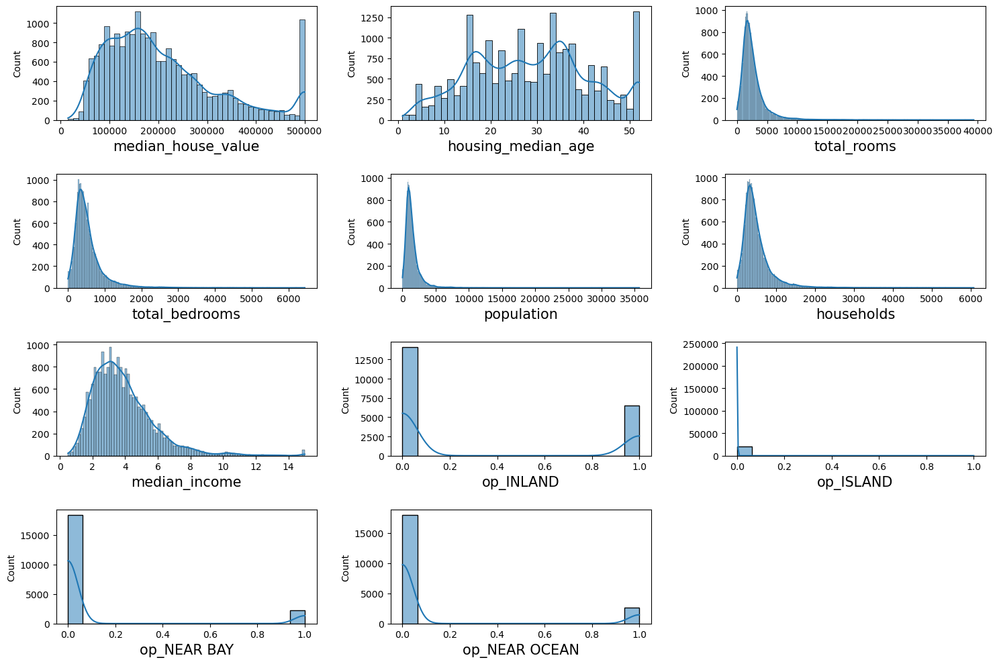

In [26]:
# Columns distribution histograms before dropping outliers
plt.figure(figsize=[15,10])
nrows, ncols = (4, 3)
for index, column in enumerate(df5.columns, start=1):
    ax = plt.subplot(nrows, ncols, index)
    sns.histplot(data=df5[column], kde=True, ax=ax)
    plt.xlabel(column, fontsize=15)
plt.tight_layout(h_pad=2, w_pad=2)
plt.show()

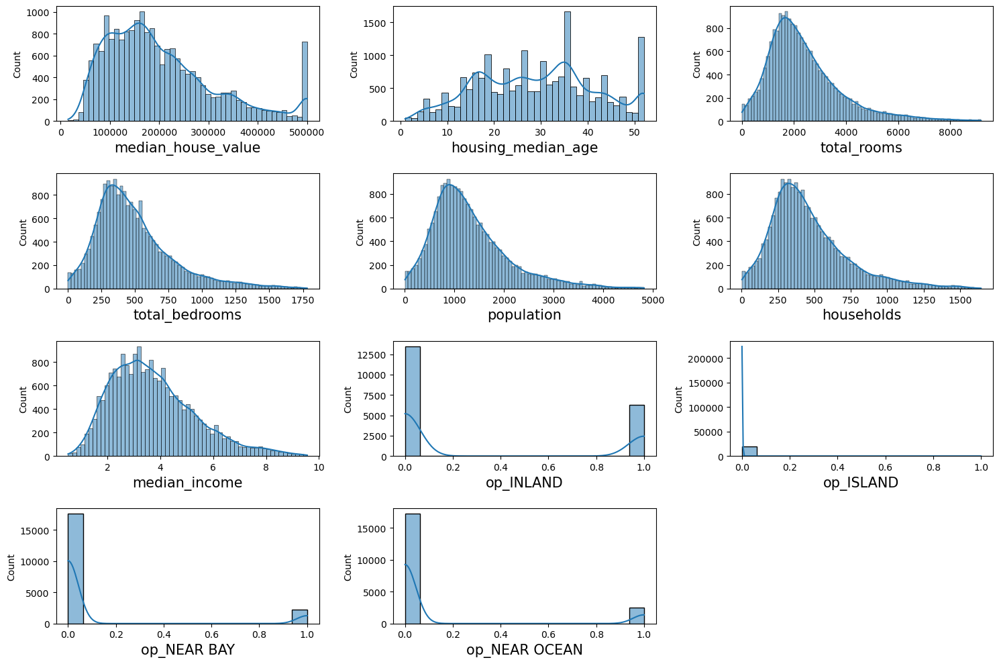

In [27]:
# Columns distribution histograms after dropping outliers
plt.figure(figsize=[15, 10])
nrows, ncols = (4, 3)
for index, column in enumerate(df6.columns, start=1):
    ax = plt.subplot(nrows, ncols, index)
    sns.histplot(data=df6[column], kde=True, ax=ax)
    plt.xlabel(column, fontsize=15)
plt.tight_layout(h_pad=2, w_pad=2)
plt.show()

## Correlation Matrix and Heatmap

In [28]:
# Correlation matrix
correlation_matrix = df6.corr().round(2)
correlation_matrix

,median_house_value,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,op_INLAND,op_ISLAND,op_NEAR BAY,op_NEAR OCEAN
median_house_value,1.00,0.12,0.17,0.08,-0.03,0.10,0.66,-0.49,0.03,0.17,0.14
housing_median_age,0.12,1.00,-0.35,-0.29,-0.26,-0.26,-0.14,-0.24,0.02,0.26,0.02
total_rooms,0.17,-0.35,1.00,0.90,0.80,0.89,0.26,0.00,-0.01,-0.01,0.00
total_bedrooms,0.08,-0.29,0.90,1.00,0.84,0.97,-0.02,-0.04,-0.00,-0.01,0.02
population,-0.03,-0.26,0.80,0.84,1.00,0.88,-0.01,-0.06,-0.01,-0.07,-0.02
households,0.10,-0.26,0.89,0.97,0.88,1.00,0.01,-0.08,-0.01,0.00,0.02
median_income,0.66,-0.14,0.26,-0.02,-0.01,0.01,1.00,-0.24,-0.01,0.06,0.01
op_INLAND,-0.49,-0.24,0.00,-0.04,-0.06,-0.08,-0.24,1.00,-0.01,-0.24,-0.26
op_ISLAND,0.03,0.02,-0.01,-0.00,-0.01,-0.01,-0.01,-0.01,1.00,-0.01,-0.01
op_NEAR BAY,0.17,0.26,-0.01,-0.01,-0.07,0.00,0.06,-0.24,-0.01,1.00,-0.14


In [29]:
# Plotting heatmap using 'plotly.express'
fig = px.imshow(correlation_matrix,
               aspect="auto",
               text_auto=True,
               title="Heatmap",
               labels=dict(color="color bar"))
fig.show()

**Insight**
- There are more than 90% positive correlation between 'total_bedrooms' and 'households' (97%), and 'total_rooms' and 'total_bedrooms' (90%). So to avoid multi-collinearity, it is suggested to drop `'total_bedrooms'` feature.
- We can see that 'median_house_value'
    - and 'housing_median_age' have weakly positive correlation.
    - and 'total_rooms' have weakly positive correlation.
    - and 'total_bedrooms' have weakly positive correlation.
    - and 'population' have weakly negative correlation.
    - and 'households' have weakly positive correlation.
    - and 'median_income' have positive correlation.
    - and 'op_INLAND' have negative correlation.
    - and 'op_ISLAND' have weakly positive correlation.
    - and 'op_NEAR BAY' have weakly positive correlation.
    - and 'op_NEAR OCEAN' have weakly positive correlation.

## Dropping Highly Correlated Feature

In [30]:
# Dropping 'total_bedrooms' feature to avoid multi-collinearity and to enhance the accuracy of the model
df7 = df6.drop(columns="total_bedrooms")
df7.sample(5)

,median_house_value,housing_median_age,total_rooms,population,households,median_income,op_INLAND,op_ISLAND,op_NEAR BAY,op_NEAR OCEAN
18578,184300.0,24.0,1943.0,1844.0,461.0,3.0192,0,0,0,0
6347,112500.0,44.0,477.0,502.0,117.0,2.0156,1,0,0,0
7529,88900.0,33.0,677.0,984.0,174.0,2.5893,0,0,0,0
517,500001.0,52.0,1611.0,556.0,179.0,8.7477,0,0,1,0
6826,238300.0,46.0,2822.0,1434.0,520.0,3.8906,0,0,0,0


# Spliting Data into Train and Test Datasets

In [31]:
# Copying 'df7' dataframe into 'df_clean'
df_clean = df7.copy()
df_clean.head()

,median_house_value,housing_median_age,total_rooms,population,households,median_income,op_INLAND,op_ISLAND,op_NEAR BAY,op_NEAR OCEAN
0,452600.0,41.0,880.0,322.0,126.0,8.3252,0,0,1,0
1,358500.0,21.0,7099.0,2401.0,1138.0,8.3014,0,0,1,0
2,352100.0,52.0,1467.0,496.0,177.0,7.2574,0,0,1,0
3,341300.0,52.0,1274.0,558.0,219.0,5.6431,0,0,1,0
4,342200.0,52.0,1627.0,565.0,259.0,3.8462,0,0,1,0


In [32]:
# Creating feature matrix of X
X = df_clean.drop(columns="median_house_value")
X.tail()

,housing_median_age,total_rooms,population,households,median_income,op_INLAND,op_ISLAND,op_NEAR BAY,op_NEAR OCEAN
20635,25.0,1665.0,845.0,330.0,1.5603,1,0,0,0
20636,18.0,697.0,356.0,114.0,2.5568,1,0,0,0
20637,17.0,2254.0,1007.0,433.0,1.7000,1,0,0,0
20638,18.0,1860.0,741.0,349.0,1.8672,1,0,0,0
20639,16.0,2785.0,1387.0,530.0,2.3886,1,0,0,0


In [33]:
# Creating target vector of y
y = df_clean["median_house_value"]
y.head()

0    452600.0
1    358500.0
2    352100.0
3    341300.0
4    342200.0
Name: median_house_value, dtype: float64

In [34]:
# Dimension of X and y
print(f"X Dimension = {X.shape}")
print(f"y Dimension = {y.shape}")

X Dimension = (19746, 9)
y Dimension = (19746,)


In [35]:
# Spliting data into train and test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print("X_train Dimension = ", X_train.shape)
print("X_test Dimension = ", X_test.shape)
print("y_train Dimension = ", y_train.shape)
print("y_test Dimension = ", y_test.shape)

X_train Dimension =  (15796, 9)
X_test Dimension =  (3950, 9)
y_train Dimension =  (15796,)
y_test Dimension =  (3950,)


# Scaling Train and Test Datasets

In [36]:
# Scaling train and test datasets using 'StandardScaler' (Except binary features and dropped feature of 'total_bedrooms')
standard_scaler = StandardScaler()
scaling_feature_columns = X_train.columns[:5]

scaled_train_array = standard_scaler.fit_transform(X_train[scaling_feature_columns])    # Fit and transform for train dataset
X_train[scaling_feature_columns] = scaled_train_array

scaled_test_array = standard_scaler.transform(X_test[scaling_feature_columns])
X_test[scaling_feature_columns] = scaled_test_array

In [37]:
X_train.sample(5)

,housing_median_age,total_rooms,population,households,median_income,op_INLAND,op_ISLAND,op_NEAR BAY,op_NEAR OCEAN
94,0.804873,-0.468711,0.021777,0.025752,-1.171346,0,0,1,0
18459,-1.531566,0.640112,1.139741,0.427912,1.560019,0,0,0,0
16276,0.321472,-0.193253,1.214876,0.476321,-1.414436,1,0,0,0
14191,-1.209299,0.263979,0.782200,0.018305,0.274961,0,0,0,1
12586,0.643739,0.878516,0.256252,0.733256,-0.125445,1,0,0,0


In [38]:
X_test.sample(5)

,housing_median_age,total_rooms,population,households,median_income,op_INLAND,op_ISLAND,op_NEAR BAY,op_NEAR OCEAN
18865,1.127140,-0.312105,-0.443285,-0.253525,-0.336636,0,0,1,0
5761,-1.531566,1.332951,1.825028,1.962078,-0.016635,0,0,0,0
6983,0.563172,-0.268060,-0.514534,-0.555145,0.512246,0,0,0,0
15593,-0.967598,-1.014732,-1.111732,-1.028056,-1.084073,1,0,0,0
7610,0.643739,-0.864419,-0.381104,-0.782291,-0.998236,0,0,0,0


# Creating Linear Regression Model Using Sklearn

* Sklearn library have multiple linear regression algorithms.
* Different algorithms are better suited for different types of data and types of problems.
* The below flowchart will give you brief idea on how to choose right algorithm.
 
---

<img src="https://raw.githubusercontent.com/satishgunjal/images/master/Choosing%20Right%20Sklearn%20Linear%20Model.png" style="margin:auto;height:600px" title="Choosing_Right_Sklearn_Linear_Model"/>

---

Pseudo Code: 

```python  

# m is number of training examples
if m <= 50:
    Normal Equations or Get more data
    
elif m >= 100k:
    SGD regressor
    
elif 50 < m < 100k and few features should be important:
    LASSO or ElasticNet
    
elif 50 < m < 100k and more features should be important:
    RidgeRegression or SVR(kernel='linear')
    if not work
    EnsembleRegressor or SVR(kernel='rbf')
    
```

**Note**

As we can see from the flowchart, because there are about 19700 samples in our dataset, and few features are important, so the best algorithm for us is `LASSO` or `ElasticNet`.

## Linear Regression Model Using Sklearn

In [39]:
# Initializing the model
linreg_ols = LinearRegression()
linreg_lasso = Lasso(alpha=1/3/3/3/3/3/3/3/3/3)
linreg_elasticnet = ElasticNet(alpha=1/3/3/3/3/3/3/3/3/3, l1_ratio=0.5)

In [40]:
# Defining a function that trains and then evaluates a specific model
def train_and_evaluate(model_object, X_train, y_train, X_test, y_test):
    """
    This function trains and then evaluates a specific model
    """
    # Training the model
    model_object.fit(X_train, y_train)

    # Evaluation of the model using 'score'
    score_train = model_object.score(X_train, y_train)
    score_test = model_object.score(X_test, y_test)

    return score_train, score_test

In [41]:
# Training and evaluating of each model
train_test = (X_train, y_train, X_test, y_test)
scores = {}

scores["Linear_Regression_OLS"] = train_and_evaluate(linreg_ols, *train_test)
scores["Linear_Regression_Lasso"] = train_and_evaluate(linreg_lasso, *train_test)
scores["Linear_Regression_ElasticNet"] = train_and_evaluate(linreg_elasticnet, *train_test)

In [42]:
# Creating dataframe for comparison of 'scores'
df_scores = pd.DataFrame(scores).T
df_scores.columns = ["Scores_Train", "Scores_Test"]
df_scores = df_scores.assign(Model = df_scores.index)
df_scores = df_scores.reset_index(drop=True)
df_scores = df_scores[["Model", "Scores_Train", "Scores_Test"]]
df_scores

,Model,Scores_Train,Scores_Test
0,Linear_Regression_OLS,0.618918,0.615098
1,Linear_Regression_Lasso,0.618918,0.615098
2,Linear_Regression_ElasticNet,0.618909,0.615162


**Insight**

After the several training it has been concluded that with 'alpha'=5.0805263425290864e-05, 'l1_ratio=0.5', the accuracy is at its most as demonstrated at the dataframe above. However, the accuracy of about 62% is `not good enough` for our model training. So this time we try polynomial regression for training of the model.

## Polynomial Regression Model Using Sklearn

In [43]:
# Fitting and transforming 'PolynomialFeatures' object on 'X_train'
poly = PolynomialFeatures(degree=4)
X_train_transformed = poly.fit_transform(X_train)

In [44]:
# Fitting 'PolynomialFeatures' object on 'X_train_transformed' and 'y_train'
poly.fit(X_train_transformed, y_train)

PolynomialFeatures(degree=4)

In [45]:
# Fitting and transforming 'PolynomialFeatures' object on 'X_test'
X_test_transformed = poly.fit_transform(X_test)

In [46]:
# Initializing the polynomial model
polyreg_ols = LinearRegression()
polyreg_lasso = Lasso(alpha=1/3/3/3/3/3/3/3/3/3)
polyreg_elasticnet = ElasticNet(alpha=1/3/3/3/3/3/3/3/3/3, l1_ratio=0.5)

In [47]:
# Training and evaluating of each polynomial model using 'train_and_evaluate' function
train_test_transformed = (X_train_transformed, y_train, X_test_transformed, y_test)
poly_scores = {}

poly_scores["Polynomial_Regression_OLS"] = train_and_evaluate(polyreg_ols, *train_test_transformed)
poly_scores["Polynomial_Regression_Lasso"] = train_and_evaluate(polyreg_lasso, *train_test_transformed)
poly_scores["Polynomial_Regression_ElasticNet"] = train_and_evaluate(polyreg_elasticnet, *train_test_transformed)

In [48]:
# Creating dataframe for comparison of 'poly_scores'
df_poly_scores = pd.DataFrame(poly_scores).T
df_poly_scores.columns = ["Polynomial_Scores_Train", "Polynomial_Scores_Test"]
df_poly_scores = df_poly_scores.assign(Polynomial_Model = df_poly_scores.index)
df_poly_scores = df_poly_scores.reset_index(drop=True)
df_poly_scores = df_poly_scores[["Polynomial_Model", "Polynomial_Scores_Train", "Polynomial_Scores_Test"]]
df_poly_scores

,Polynomial_Model,Polynomial_Scores_Train,Polynomial_Scores_Test
0,Polynomial_Regression_OLS,0.725667,0.639957
1,Polynomial_Regression_Lasso,0.722739,0.651727
2,Polynomial_Regression_ElasticNet,0.722731,0.695153


**Insight**

After performing several training, it is concluded that the polynomial regression model (with degree of 4) using 'ElasticNet' algorithm (with 'alpha'=5.0805263425290864e-05, 'l1_ratio=0.5') has the best performance with test score of 70%. For furture processing and evaluation, we continue with this model.

In [49]:
# Creating dataframe for comparing 'y_true' and 'y_pred' of polynomial regression using 'ElasticNet' algorithm
y_true = y_test
y_pred = polyreg_elasticnet.predict(X_test_transformed)

y_true_vs_y_pred_dict = {"median_house_value_true" : y_true, "median_house_value_pred" : y_pred}
df_actual_vs_predicted = pd.DataFrame(y_true_vs_y_pred_dict)
negative_median_house_value = df_actual_vs_predicted.query("median_house_value_pred <= 0")
negative_median_house_value

,median_house_value_true,median_house_value_pred
3353,49500.0,-63742.934310
2107,55600.0,-90326.142383


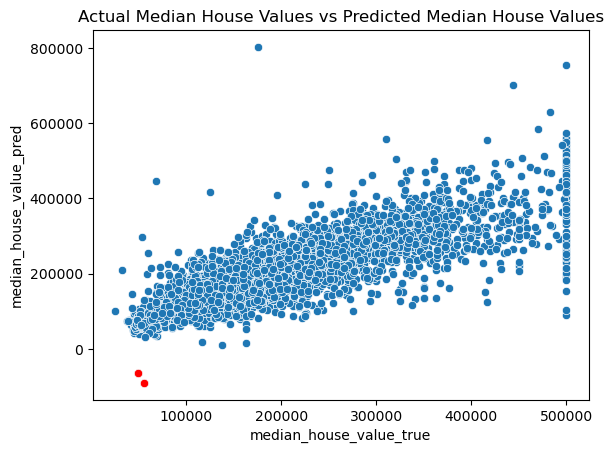

In [50]:
# Plotting 'median_house_value_true' vs 'median_house_value_pred'
plt.title("Actual Median House Values vs Predicted Median House Values")
sns.scatterplot(data = df_actual_vs_predicted,
                x = "median_house_value_true",
                y = "median_house_value_pred")
sns.scatterplot(data = negative_median_house_value,
                x = "median_house_value_true",
                y = "median_house_value_pred",
                color = "red")
plt.show()

**Insight**

As it is demonstrated, actual and predicted values have good linear correlation.

## Evaluation of the Model

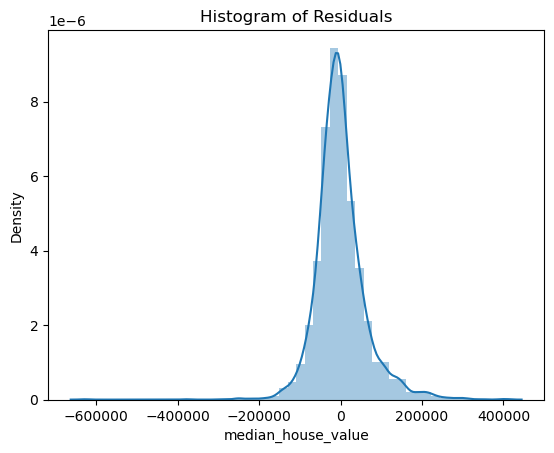

In [51]:
# Plotting histogram of residuals
residuals = y_true - y_pred
plt.title("Histogram of Residuals")
sns.distplot(residuals)
plt.show()

In [52]:
# Skewness of residuals
residuals.skew()

0.6513537441360252

Skewness Boundaries
- (-0.5, 0.5) — low or approximately symmetric.
- (-1, -0.5) U (0.5, 1) — moderately skewed.
- Beyond -1 and 1 — Highly skewed.

# Creating Linear Regression Model Using Decision Tree

## Linear Regression Model Using Decision Tree

In [53]:
# Building the decision tree object
dtreg = DecisionTreeRegressor(max_depth=3)    # To keep the size of the tree small, we set max_depth = 3

In [54]:
# Fitting the decision tree object on train dataset
dtreg.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=3)

## Visualizing the Decision Tree of the Model

In [55]:
# Representing the decision tree of the model as text
feature_names = df_clean.columns.tolist()[1:]
text_representation = export_text(dtreg, feature_names=feature_names)
print(text_representation)

|--- median_income <= 0.50
|   |--- op_INLAND <= 0.50
|   |   |--- median_income <= -0.56
|   |   |   |--- value: [163516.36]
|   |   |--- median_income >  -0.56
|   |   |   |--- value: [225019.61]
|   |--- op_INLAND >  0.50
|   |   |--- median_income <= -0.53
|   |   |   |--- value: [88606.53]
|   |   |--- median_income >  -0.53
|   |   |   |--- value: [131935.24]
|--- median_income >  0.50
|   |--- median_income <= 1.63
|   |   |--- op_INLAND <= 0.50
|   |   |   |--- value: [283949.81]
|   |   |--- op_INLAND >  0.50
|   |   |   |--- value: [188979.81]
|   |--- median_income >  1.63
|   |   |--- housing_median_age <= -0.12
|   |   |   |--- value: [349543.48]
|   |   |--- housing_median_age >  -0.12
|   |   |   |--- value: [434704.59]



In [56]:
# Visualization of the decision tree using 'dtreeviz'
dtviz = dtreeviz.model(dtreg,
                       X_train,
                       y_train,
                       feature_names=feature_names,
                       target_name="median_house_value")
dtviz.view()

## Evaluation of the Decision Tree Model

In [57]:
# Accuracy score of the decision tree model
y_true_dt = y_test
y_pred_dt = dtreg.predict(X_test)
print(f"Accuracy score of the decision tree model is: {dtreg.score(X_test, y_test) * 100:.2f}")

Accuracy score of the decision tree model is: 51.86


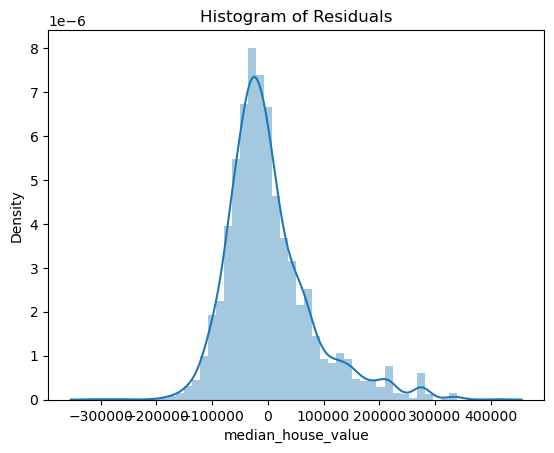

In [58]:
# Plotting histogram of residuals for decision tree model
residuals_dt = y_true_dt - y_pred_dt
plt.title("Histogram of Residuals for Decision Tree Model")
sns.distplot(residuals_dt)
plt.show()

In [59]:
# Skewness of residuals for decision tree model
residuals_dt.skew()

1.2488231137838943

Skewness Boundaries
- (-0.5, 0.5) — low or approximately symmetric.
- (-1, -0.5) U (0.5, 1) — moderately skewed.
- Beyond -1 and 1 — Highly skewed.

# Creating Linear Regression Model Using Random Forest

## Linear Regression Model Using Random Forest

In [61]:
# Building random forest regression object
rfreg = RandomForestRegressor(random_state=42)

In [62]:
# Fitting random forest object on train dataset
rfreg.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

## Evaluation of the Random Forest Model

In [64]:
# Accuracy score of the random forest model
y_true_rf = y_test
y_pred_rf = rfreg.predict(X_test)
print(f"Accuracy score of the random forest model is: {rfreg.score(X_test, y_test) * 100:.2f}")

Accuracy score of the random forest model is: 68.58


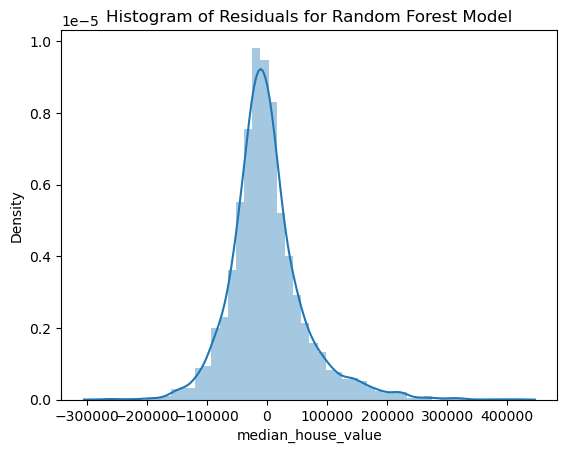

In [66]:
# Plotting histogram of residuals for random forest model
residuals_rf = y_true_rf - y_pred_rf
plt.title("Histogram of Residuals for Random Forest Model")
sns.distplot(residuals_rf)
plt.show()

In [68]:
# Skewness of residuals for random forest model
residuals_rf.skew()

1.0492855725172248

Skewness Boundaries
- (-0.5, 0.5) — low or approximately symmetric.
- (-1, -0.5) U (0.5, 1) — moderately skewed.
- Beyond -1 and 1 — Highly skewed.

# Final Conclusion

For linear regression model:
-  The `polynomial regression model` (with degree of 4) using 'ElasticNet' algorithm as the best training model, resulted in the accuracy of 70% for the test dataset.
- The residual histogram of the model is normally distributed with the moderate skewness of 0.65.
- There are two negative median house value in the prediction of the model.

For decision tree regression model:
- The decision tree regression model has the accuracy of 52% for test dataset.
- The residual histogram of the decision tree model is normally distributed with the high skewness of 1.25.
  
For random forest regression model:
- The random forest regression model has the accuracy of 69% for test dataset.
- The residual histogram of the random forest model is normally distributed with the high skewness of 1.05.